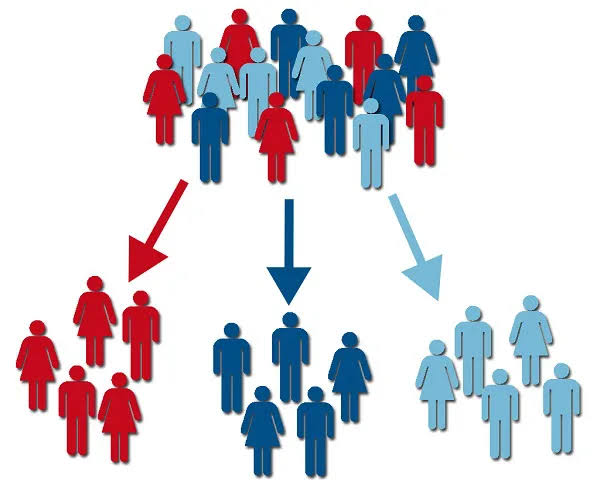

## Goal: Customer Segmentation
Customer Segmentation creates information that supports decision making by matching the right customers with the right services and products. With customer segmentation, actions that can address customers' concerns can be taken with greater precision.

In this analysis, K-means and Agglomerative clustering were utilized using the market campaign dataset. 

## Libraries Used 

* Pandas
* Numpy
* Matplotlib
* Seaborn
* Scikit Learn
* Plotly
* Scipy




### Importing Libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import colors
from matplotlib.colors import ListedColormap
import seaborn as sns
import plotly as py
import plotly.graph_objs as go
from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering
import scipy.cluster.hierarchy as sch
from  sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.decomposition import PCA
import plotly.express as px



In [2]:
import warnings
import sys
if not sys.warnoptions:
    import warnings
    warnings.simplefilter("ignore")
py.offline.init_notebook_mode()
import plotly.offline as py
py.init_notebook_mode()
import plotly.graph_objs as go
import plotly.tools as tls
import plotly.figure_factory as ff

### Importing the Dataset

In [3]:
df = pd.read_csv('marketing_campaign.csv', sep=';')

In [4]:
pd.set_option('display.max_columns', None)

* **Let's get some info from the data**

In [5]:
df.head()

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,Graduation,Single,58138.0,0,0,2012-09-04,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344.0,1,1,2014-03-08,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Together,71613.0,0,0,2013-08-21,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,3,11,0
3,6182,1984,Graduation,Together,26646.0,1,0,2014-02-10,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,3,11,0
4,5324,1981,PhD,Married,58293.0,1,0,2014-01-19,94,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,3,11,0


In [6]:
df.describe()

,ID,Year_Birth,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
count,2240.000000,2240.000000,2216.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.0,2240.0,2240.000000
mean,5592.159821,1968.805804,52247.251354,0.444196,0.506250,49.109375,303.935714,26.302232,166.950000,37.525446,27.062946,44.021875,2.325000,4.084821,2.662054,5.790179,5.316518,0.072768,0.074554,0.072768,0.064286,0.013393,0.009375,3.0,11.0,0.149107
std,3246.662198,11.984069,25173.076661,0.538398,0.544538,28.962453,336.597393,39.773434,225.715373,54.628979,41.280498,52.167439,1.932238,2.778714,2.923101,3.250958,2.426645,0.259813,0.262728,0.259813,0.245316,0.114976,0.096391,0.0,0.0,0.356274
min,0.000000,1893.000000,1730.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
25%,2828.250000,1959.000000,35303.000000,0.000000,0.000000,24.000000,23.750000,1.000000,16.000000,3.000000,1.000000,9.000000,1.000000,2.000000,0.000000,3.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
50%,5458.500000,1970.000000,51381.500000,0.000000,0.000000,49.000000,173.500000,8.000000,67.000000,12.000000,8.000000,24.000000,2.000000,4.000000,2.000000,5.000000,6.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
75%,8427.750000,1977.000000,68522.000000,1.000000,1.000000,74.000000,504.250000,33.000000,232.000000,50.000000,33.000000,56.000000,3.000000,6.000000,4.000000,8.000000,7.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
max,11191.000000,1996.000000,666666.000000,2.000000,2.000000,99.000000,1493.000000,199.000000,1725.000000,259.000000,263.000000,362.000000,15.000000,27.000000,28.000000,13.000000,20.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,3.0,11.0,1.000000


### Data Cleaning

* **Inspecting the data types.**

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 29 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ID                   2240 non-null   int64  
 1   Year_Birth           2240 non-null   int64  
 2   Education            2240 non-null   object 
 3   Marital_Status       2240 non-null   object 
 4   Income               2216 non-null   float64
 5   Kidhome              2240 non-null   int64  
 6   Teenhome             2240 non-null   int64  
 7   Dt_Customer          2240 non-null   object 
 8   Recency              2240 non-null   int64  
 9   MntWines             2240 non-null   int64  
 10  MntFruits            2240 non-null   int64  
 11  MntMeatProducts      2240 non-null   int64  
 12  MntFishProducts      2240 non-null   int64  
 13  MntSweetProducts     2240 non-null   int64  
 14  MntGoldProds         2240 non-null   int64  
 15  NumDealsPurchases    2240 non-null   i

* **Checking for null values**

In [8]:
df.isnull().sum()

ID                      0
Year_Birth              0
Education               0
Marital_Status          0
Income                 24
Kidhome                 0
Teenhome                0
Dt_Customer             0
Recency                 0
MntWines                0
MntFruits               0
MntMeatProducts         0
MntFishProducts         0
MntSweetProducts        0
MntGoldProds            0
NumDealsPurchases       0
NumWebPurchases         0
NumCatalogPurchases     0
NumStorePurchases       0
NumWebVisitsMonth       0
AcceptedCmp3            0
AcceptedCmp4            0
AcceptedCmp5            0
AcceptedCmp1            0
AcceptedCmp2            0
Complain                0
Z_CostContact           0
Z_Revenue               0
Response                0
dtype: int64

* **There are some missing values at the income column**
* **Dt_Customer column needs to be processed to its proper format**
* **There are  3 categorical (non_numerical) columns.**


* **Let's fill up the missing values first**

In [11]:
mean_value=df['Income'].mean()

df['Income'].fillna(value=mean_value, inplace=True)

* **Let's confirm that there are no more missing values.**

In [13]:
df.isnull().sum()

ID                     0
Year_Birth             0
Education              0
Marital_Status         0
Income                 0
Kidhome                0
Teenhome               0
Dt_Customer            0
Recency                0
MntWines               0
MntFruits              0
MntMeatProducts        0
MntFishProducts        0
MntSweetProducts       0
MntGoldProds           0
NumDealsPurchases      0
NumWebPurchases        0
NumCatalogPurchases    0
NumStorePurchases      0
NumWebVisitsMonth      0
AcceptedCmp3           0
AcceptedCmp4           0
AcceptedCmp5           0
AcceptedCmp1           0
AcceptedCmp2           0
Complain               0
Z_CostContact          0
Z_Revenue              0
Response               0
dtype: int64

* **Let's create a column that shows how many days customers have been registered with the company.**
>* We need to show the oldest customer and newest customer.

In [14]:
df["Dt_Customer"] = pd.to_datetime(df["Dt_Customer"])
dates = []
for t in df["Dt_Customer"]:
    t = t.date()
    dates.append(t)  

print("Registration date of the newest customer on record is:",max(dates))
print("Registration date of the oldest customer on record is:",min(dates))


Registration date of the newest customer on record is: 2014-06-29
Registration date of the oldest customer on record is: 2012-07-30


* **We look for unique values in columns that are categorical.**

In [16]:
print("Unique value in Martial Status column: \n ", df["Marital_Status"].value_counts(), "\n")
print("Unique value in Education column: \n ", df["Education"].value_counts())


Unique value in Martial Status column: 
  Married     864
Together    580
Single      480
Divorced    232
Widow        77
Alone         3
Absurd        2
YOLO          2
Name: Marital_Status, dtype: int64 

Unique value in Education column: 
  Graduation    1127
PhD            486
Master         370
2n Cycle       203
Basic           54
Name: Education, dtype: int64


### We'll perform label encoding operation by changing the labels of unique values because there are many columns.

* Married : Partner
* Together : Partner
* Absurd : Alone
* Widow : Alone
* YOLO : Alone
* Single : Alone

* 
* Basic : Undergraduate
* 2n Cycle : Undergraduate
* Graduatition : Graduate
* Master : Graduate
* PhD : Graduate

### Let's carry out some feature engineering
* **Let's open a new column called Customer_For and age of Customer.**

In [17]:
days = []
d1 = max(dates)
for i in dates:
    alpha = d1 - i
    days.append(alpha)
df["Customer_For"] = days
df["Customer_For"] = pd.to_numeric(df["Customer_For"], errors="coerce")


In [18]:
df["Age"] = 2022-df["Year_Birth"]


* **Miscellaneous expenses**

In [19]:
df["Spent"] = df["MntWines"]+ df["MntFruits"]+ df["MntMeatProducts"]+ df["MntFishProducts"]+ df["MntSweetProducts"]+ df["MntGoldProds"]

* **Determine the client's marital status.**

In [20]:
df["Living_With"] = df["Marital_Status"].replace({"Married":"Partner", "Together":"Partner", "Absurd":"Alone", "Widow":"Alone", "YOLO":"Alone", "Divorced":"Alone", "Single":"Alone",})

 * **Total number of children living at home**

In [21]:
df["Children"] = df["Kidhome"] + df["Teenhome"]

**Total size of the family**

In [22]:
df["Family_Size"] = df["Living_With"].replace({"Alone": 1, "Partner":2}) + df["Children"]
df["Family_Size"]

0       1
1       3
2       2
3       3
4       3
       ..
2235    3
2236    5
2237    1
2238    3
2239    4
Name: Family_Size, Length: 2240, dtype: int64

* **Parent status**

In [23]:
df["Is_Parent"] = np.where(df.Children > 0, 1, 0)


* **Division of education status**

In [24]:
df["Education"] = df["Education"].replace({"Basic":"Undergraduate","2n Cycle":"Undergraduate", "Graduation":"Graduate", "Master":"Graduate", "PhD":"Graduate"})

* **Editing some column names**

In [25]:
df = df.rename(columns={"MntWines": "Wines", "MntFruits":"Fruits", "MntMeatProducts":"Meat", "MntFishProducts":"Fish", "MntSweetProducts":"Sweets", "MntGoldProds":"Gold"})

- `Z_CostContact and Z_Revenue` have fixed values. 
- We drop them from the dataset because they are unnecessary.

In [26]:
df.Z_CostContact.describe()

count    2240.0
mean        3.0
std         0.0
min         3.0
25%         3.0
50%         3.0
75%         3.0
max         3.0
Name: Z_CostContact, dtype: float64

In [27]:
df.Z_Revenue.describe()

count    2240.0
mean       11.0
std         0.0
min        11.0
25%        11.0
50%        11.0
75%        11.0
max        11.0
Name: Z_Revenue, dtype: float64

In [28]:
to_drop = ["Marital_Status", "Dt_Customer", "Z_CostContact", "Z_Revenue", "Year_Birth", "ID"]
df = df.drop(to_drop, axis=1)

* **Converting categorical values to numerical value**

In [29]:
le = LabelEncoder()
df['Education'] = df[['Education']].apply(le.fit_transform)
df['Living_With'] = df[['Living_With']].apply(le.fit_transform)

In [30]:
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 30 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Education            2240 non-null   int32  
 1   Income               2240 non-null   float64
 2   Kidhome              2240 non-null   int64  
 3   Teenhome             2240 non-null   int64  
 4   Recency              2240 non-null   int64  
 5   Wines                2240 non-null   int64  
 6   Fruits               2240 non-null   int64  
 7   Meat                 2240 non-null   int64  
 8   Fish                 2240 non-null   int64  
 9   Sweets               2240 non-null   int64  
 10  Gold                 2240 non-null   int64  
 11  NumDealsPurchases    2240 non-null   int64  
 12  NumWebPurchases      2240 non-null   int64  
 13  NumCatalogPurchases  2240 non-null   int64  
 14  NumStorePurchases    2240 non-null   int64  
 15  NumWebVisitsMonth    2240 non-null   i

#### Now we can see what our new dataframe looks like.

In [31]:
df

,Education,Income,Kidhome,Teenhome,Recency,Wines,Fruits,Meat,Fish,Sweets,Gold,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Customer_For,Age,Spent,Living_With,Children,Family_Size,Is_Parent
0,0,58138.0,0,0,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,1,57283200000000000,65,1617,0,0,1,0
1,0,46344.0,1,1,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,0,9763200000000000,68,27,0,2,3,1
2,0,71613.0,0,0,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,0,26956800000000000,57,776,1,0,2,0
3,0,26646.0,1,0,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,0,12009600000000000,38,53,1,1,3,1
4,0,58293.0,1,0,94,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,0,13910400000000000,41,422,1,1,3,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,0,61223.0,0,1,46,709,43,182,42,118,247,2,9,3,4,5,0,0,0,0,0,0,0,32918400000000000,55,1341,1,1,3,1
2236,0,64014.0,2,1,56,406,0,30,0,0,8,7,8,2,5,7,0,0,0,1,0,0,0,1641600000000000,76,444,1,3,5,1
2237,0,56981.0,0,0,91,908,48,217,32,12,24,1,2,3,13,6,0,1,0,0,0,0,0,13392000000000000,41,1241,0,0,1,0
2238,0,69245.0,0,1,8,428,30,214,80,30,61,2,6,5,10,3,0,0,0,0,0,0,0,13478400000000000,66,843,1,1,3,1


* **PairPlot**

Pairplot plots helps us to see the pairwise relationships in a dataset. 
It creates a grid of Axes such that each variable in the data is shared along the y-axis along a single row and on the x-axis along a single column.

<Figure size 432x288 with 0 Axes>

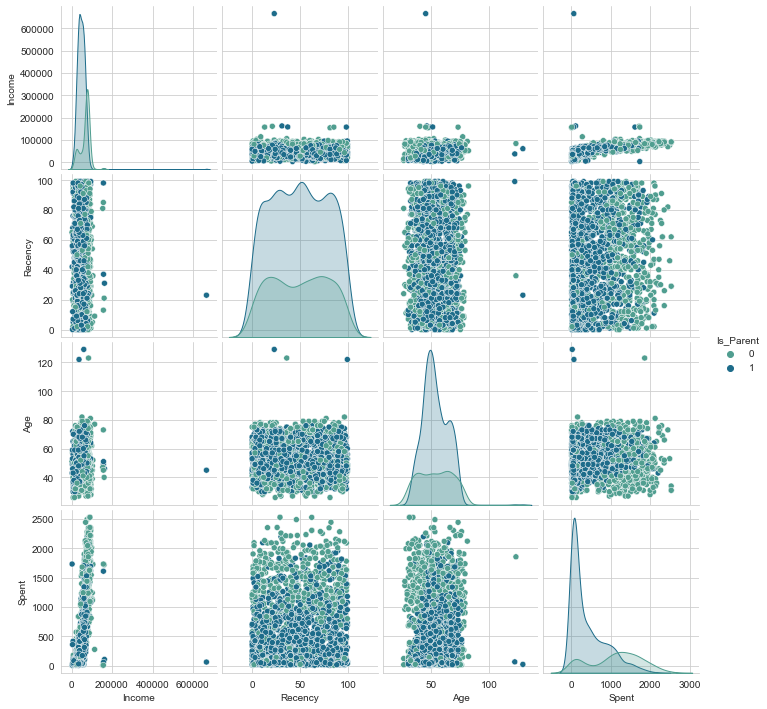

In [32]:
sns.set_style("whitegrid")
plt.figure()
sns.pairplot(df[["Income", "Recency", "Age", "Spent", "Is_Parent"]], hue='Is_Parent', palette='crest')
plt.show()


In [33]:
df.describe()

,Education,Income,Kidhome,Teenhome,Recency,Wines,Fruits,Meat,Fish,Sweets,Gold,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Customer_For,Age,Spent,Living_With,Children,Family_Size,Is_Parent
count,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2.240000e+03,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000
mean,0.114732,52247.251354,0.444196,0.506250,49.109375,303.935714,26.302232,166.950000,37.525446,27.062946,44.021875,2.325000,4.084821,2.662054,5.790179,5.316518,0.072768,0.074554,0.072768,0.064286,0.013393,0.009375,0.149107,3.054950e+16,53.194196,605.798214,0.644643,0.950446,2.595089,0.715179
std,0.318770,25037.797168,0.538398,0.544538,28.962453,336.597393,39.773434,225.715373,54.628979,41.280498,52.167439,1.932238,2.778714,2.923101,3.250958,2.426645,0.259813,0.262728,0.259813,0.245316,0.114976,0.096391,0.356274,1.746339e+16,11.984069,602.249288,0.478728,0.751803,0.906959,0.451430
min,0.000000,1730.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,26.000000,5.000000,0.000000,0.000000,1.000000,0.000000
25%,0.000000,35538.750000,0.000000,0.000000,24.000000,23.750000,1.000000,16.000000,3.000000,1.000000,9.000000,1.000000,2.000000,0.000000,3.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.561680e+16,45.000000,68.750000,0.000000,0.000000,2.000000,0.000000
50%,0.000000,51741.500000,0.000000,0.000000,49.000000,173.500000,8.000000,67.000000,12.000000,8.000000,24.000000,2.000000,4.000000,2.000000,5.000000,6.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.071520e+16,52.000000,396.000000,1.000000,1.000000,3.000000,1.000000
75%,0.000000,68289.750000,1.000000,1.000000,74.000000,504.250000,33.000000,232.000000,50.000000,33.000000,56.000000,3.000000,6.000000,4.000000,8.000000,7.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.570560e+16,63.000000,1045.500000,1.000000,1.000000,3.000000,1.000000
max,1.000000,666666.000000,2.000000,2.000000,99.000000,1493.000000,199.000000,1725.000000,259.000000,263.000000,362.000000,15.000000,27.000000,28.000000,13.000000,20.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,6.039360e+16,129.000000,2525.000000,1.000000,3.000000,5.000000,1.000000


##  **Outlier Detection**

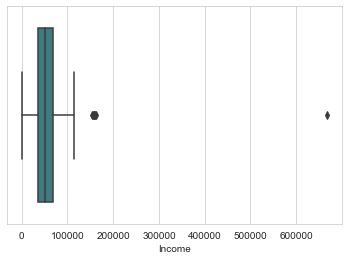

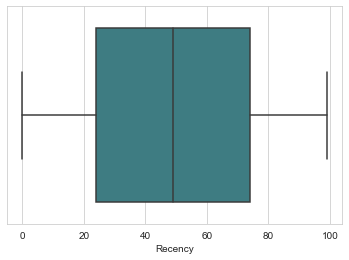

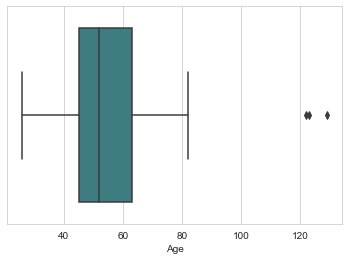

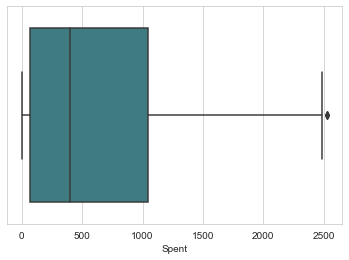

In [34]:
personal = ["Income", "Recency", "Age", "Spent"]


for i in personal:
    plt.figure()
    sns.boxplot(x=df[i], palette='crest')
    plt.show()
    

**Inter Quantile Range**
* We will use the IQR method to detect outlier data.
* First of all, it is necessary to find the distance between the quartiles in the data. (IQR = Q3 - Q1) 

![](https://github.com/emreyesilyurt/customer_segmentation/blob/main/assets/Interquartile-Odd.png?raw=true)


In [36]:
df['Age'].quantile(0.25)


45.0

In [37]:
df['Age'].quantile(0.75)

63.0

* **Then IQR limits are determined.**

In [38]:
Q1 = df['Age'].quantile(0.25)
Q3 = df['Age'].quantile(0.75)
IQR = Q3 - Q1

In [39]:
IQR

18.0

In [40]:
lower_lim = Q1 - 1.5 * IQR
upper_lim = Q3 + 1.5 * IQR

#The fixed value used during the determination of the limits changes according to the state of the data.

In [41]:
lower_lim

18.0

In [42]:
upper_lim

90.0

* **We'll extract the outlier data from our dataset.**

In [43]:
outliers_low = (df['Age'] < lower_lim)

outliers_up = (df['Age'] > upper_lim)

len(df['Age'] - (len(df['Age'][outliers_low] + len(df['Age'][outliers_up]))))

In [44]:
df['Age'][(outliers_low | outliers_up)]

In [45]:
df['Age'][~(outliers_low | outliers_up)]

2240

In [48]:
df = df[~(outliers_low | outliers_up)]

<AxesSubplot:xlabel='Age'>

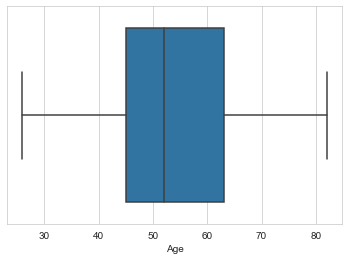

In [50]:
sns.boxplot(df.Age)

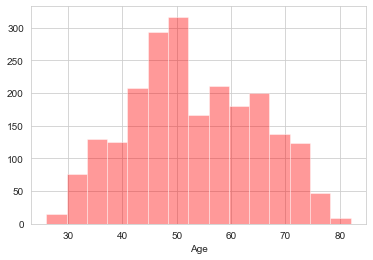

In [52]:
sns.distplot(df['Age'], bins = 15, kde = False, color = 'r')
plt.show()

As you can see, there are no more outliers in the data.

<AxesSubplot:xlabel='Income'>

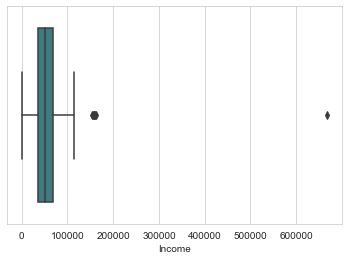

In [53]:
sns.boxplot(df.Income, palette='crest')

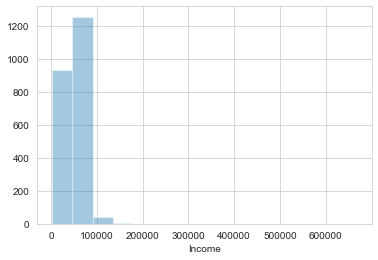

In [54]:
sns.distplot(df['Income'], bins = 15, kde = False)
plt.show()

This isn't how we want it to be.
* **Let's handle the income column**

In [58]:
Q1 = df['Income'].quantile(0.25)
Q3 = df['Income'].quantile(0.75)
IQR = Q3 - Q1

lower_lim = Q1 - 1.5 * IQR
upper_lim = Q3 + 1.5 * IQR

outliers_low = (df['Income'] < lower_lim)
outliers_up = (df['Income'] > upper_lim)
len(df['Income'] - (len(df['Income'][outliers_low] + len(df['Income'][outliers_up]))))
df['Income'][(outliers_low | outliers_up)]
df['Income'][~(outliers_low | outliers_up)]
df = df[~(outliers_low | outliers_up)]

Now let's check the income column again.

<AxesSubplot:xlabel='Income'>

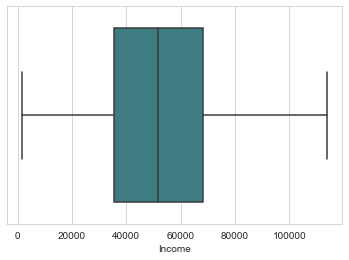

In [59]:
sns.boxplot(df.Income, palette='crest')

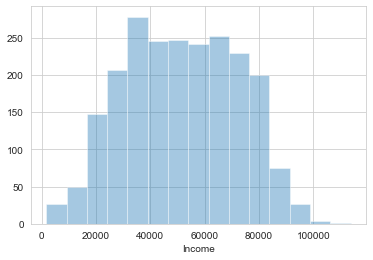

In [60]:
sns.distplot(df['Income'], bins = 15, kde = False)
plt.show()

## Correlation
* **It is a statistical method used to determine whether there is a linear relationship between two numerical values, and hence, the direction and severity of this relationship.**


<AxesSubplot:>

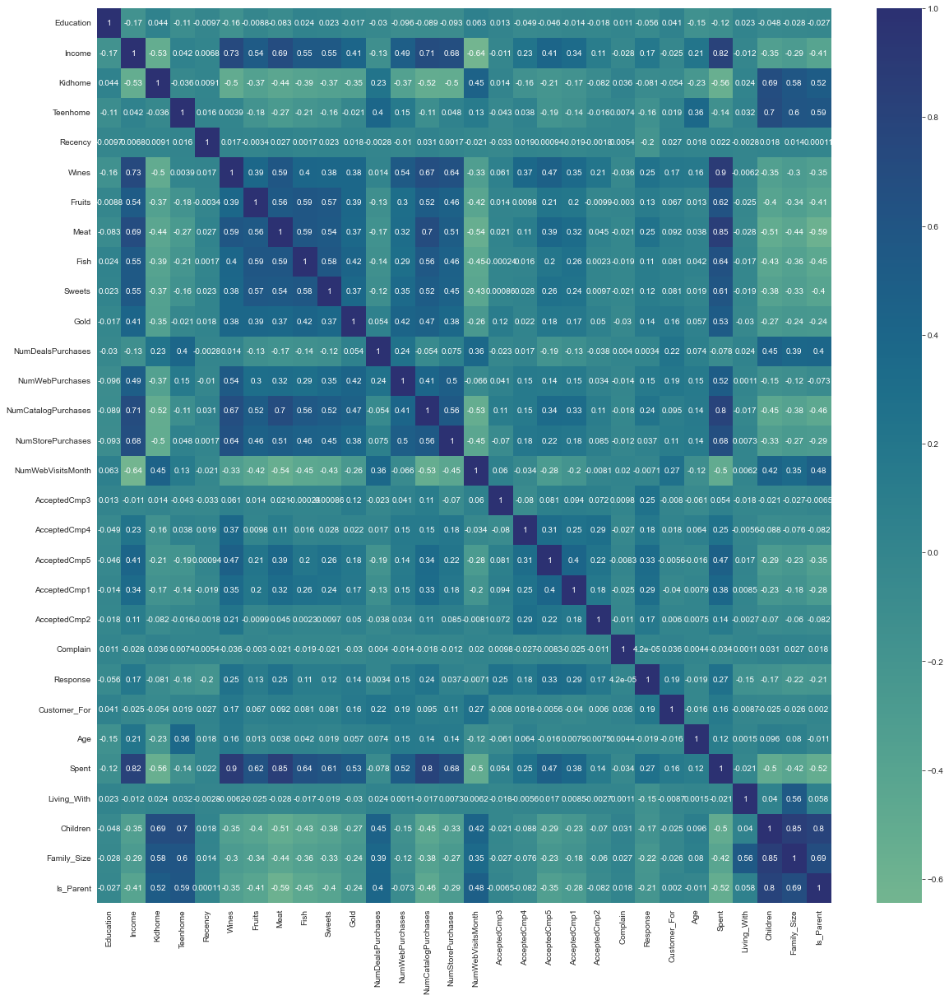

In [61]:
corrmat = df.corr()
plt.figure(figsize = (20,20))  
sns.heatmap(corrmat,annot=True, center=0, cmap='crest')

### **Data preprocessing**

* **We are removing columns related to deals and promotions from the dataset as they cause semantic confusion.**

In [62]:
new_df = df.copy()
cols_del = ['AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1','AcceptedCmp2', 'Complain', 'Response']
new_df = new_df.drop(cols_del, axis=1)

*  **Scaling the data**

In [63]:
sc = StandardScaler()
sc.fit(new_df)
scaled_df = pd.DataFrame(sc.transform(new_df), columns = new_df.columns )

In [64]:
scaled_df

,Education,Income,Kidhome,Teenhome,Recency,Wines,Fruits,Meat,Fish,Sweets,Gold,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,Customer_For,Age,Spent,Living_With,Children,Family_Size,Is_Parent
0,-0.359415,0.316030,-0.825592,-0.931676,0.307314,0.980166,1.550778,1.736151,2.456789,1.472029,0.842690,0.358938,1.405471,2.633984,-0.559160,0.689920,1.529265,1.015715,1.683247,-1.345676,-1.266277,-1.759459,-1.587869
1,-0.359415,-0.256586,1.031365,0.904492,-0.383771,-0.873191,-0.637618,-0.726371,-0.651738,-0.632996,-0.731824,-0.168815,-1.117198,-0.585437,-1.176175,-0.138430,-1.190769,1.272020,-0.962795,-1.345676,1.393978,0.445057,0.629775
2,-0.359415,0.970262,-0.825592,-0.931676,-0.798422,0.359410,0.569773,-0.174584,1.341376,-0.149082,-0.040574,-0.696567,1.405471,-0.227723,1.291882,-0.552605,-0.206611,0.332234,0.283674,0.743121,-1.266277,-0.657201,-1.587869
3,-0.359415,-1.212954,1.031365,-0.931676,-0.798422,-0.873191,-0.562156,-0.662528,-0.505455,-0.584604,-0.751025,-0.168815,-0.756817,-0.943150,-0.559160,0.275745,-1.062186,-1.291031,-0.919526,0.743121,0.063851,0.445057,0.629775
4,-0.359415,0.323556,1.031365,-0.931676,1.551268,-0.392031,0.418849,-0.215626,0.152822,-0.003908,-0.559011,1.414444,0.324327,0.129990,0.057854,-0.138430,-0.953384,-1.034726,-0.305445,0.743121,0.063851,0.445057,0.629775
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2224,-0.359415,0.465812,-0.825592,0.904492,-0.107337,1.199955,0.418849,0.076229,0.079680,2.197900,3.895711,-0.168815,1.765853,0.129990,-0.559160,-0.138430,0.134629,0.161364,1.223934,0.743121,0.063851,0.445057,0.629775
2225,-0.359415,0.601319,2.888322,0.904492,0.238206,0.300008,-0.662772,-0.616926,-0.688309,-0.657191,-0.693421,2.469949,1.405471,-0.227723,-0.250653,0.689920,-1.655648,1.955500,-0.268833,0.743121,2.724106,2.649574,0.629775
2226,-0.359415,0.259856,-0.825592,-0.931676,1.447605,1.791009,0.544619,0.235837,-0.103175,-0.366843,-0.386199,-0.696567,-0.756817,0.129990,2.217403,0.275745,-0.983057,-1.034726,1.057517,-1.345676,-1.266277,-1.759459,-1.587869
2227,-0.359415,0.855292,-0.825592,0.904492,-1.420399,0.365350,0.091848,0.222156,0.774527,0.068679,0.324253,-0.168815,0.684708,0.845417,1.291882,-0.966779,-0.978112,1.101150,0.395174,0.743121,0.063851,0.445057,0.629775


## PRINCIPAL COMPONENT ANALYSIS
### **Dimension Reduction**

* **In some cases, dimension reduction is very important.**

>* **For example: improving model performance or enabling visualization.**

![](https://github.com/emreyesilyurt/customer_segmentation/blob/main/assets/pca.png?raw=true)

**By performing this operation, we'll be able to look at the data from a different point of view as new attributes can be extracted.**

In [65]:
pca = PCA(n_components=3)
pca.fit(scaled_df)
pca_df = pd.DataFrame(pca.transform(scaled_df), columns=(["First_Column","Second_Column", "Third_Column"]))
pca_df.describe().T

,count,mean,std,min,25%,50%,75%,max
First_Column,2229.0,2.450560e-17,2.897012,-6.025380,-2.556318,-0.790779,2.435875,7.546411
Second_Column,2229.0,1.280069e-16,1.722300,-4.384414,-1.320616,-0.180058,1.249482,6.204203
Third_Column,2229.0,5.254757e-18,1.238816,-3.385394,-0.827137,-0.041759,0.827515,6.429199


In [66]:
pca_df

,First_Column,Second_Column,Third_Column
0,5.013827,-0.201598,2.301202
1,-2.875021,0.069315,-1.782332
2,2.618429,-0.740504,-0.350609
3,-2.687844,-1.457772,-0.335301
4,-0.612702,0.259817,0.023343
...,...,...,...
2224,2.314878,2.363096,0.675740
2225,-3.040796,4.123276,-1.292170
2226,2.672355,-1.872488,0.145840
2227,1.562130,1.729290,-1.784393


## Image of data reduced to 3D

In [67]:
Scene = dict(xaxis = dict(title  = 'First Column'),yaxis = dict(title  = 'Second Column'),zaxis = dict(title  = 'Third Column'))
trace = go.Scatter3d(x=pca_df['First_Column'], y=pca_df['Second_Column'], z=pca_df['Third_Column'], mode='markers',marker=dict(color = 'blue', size= 10, line=dict(color= 'black',width = 10)))
layout = go.Layout(margin=dict(l=0,r=0),scene = Scene,height = 800,width = 800)
data = [trace]
fig = go.Figure(data = data, layout = layout)
fig.show()

# Modelling

**KMeans**

**K-Means starts by randomly choosing the center point of k clusters, and the data points outside the center are included in the clusters they are similar to, according to their distance from the mean values of the clusters. Then, the average value of each cluster is calculated and new cluster centers are determined. Again, the distances of the objects from the center are examined continuosly until it's over.**

In [68]:
plt.rcParams['figure.figsize'] = [8,8]
sns.set_style("whitegrid")
colors = plt.rcParams['axes.prop_cycle'].by_key()['color']

inertia_list = []
for num_clusters in range(1, 11):
    kmeans_model = KMeans(n_clusters=num_clusters, init="k-means++")
    kmeans_model.fit(pca_df)
    inertia_list.append(kmeans_model.inertia_)
    


### Plotting the inertia curve using the elbow method

Text(0.5, 1.0, 'Elbow Method')

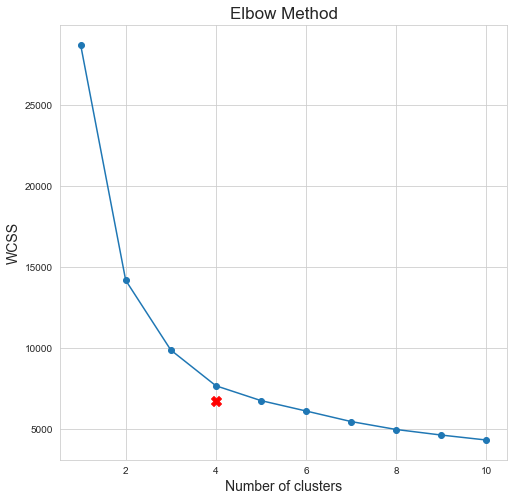

In [69]:
plt.plot(range(1,11),inertia_list)
plt.scatter(range(1,11),inertia_list)
plt.scatter(4, inertia_list[4], marker="X", s=100, c="r")
plt.xlabel("Number of clusters", size=14)
plt.ylabel("WCSS", size=14)
plt.title("Elbow Method", size=17)

In [70]:
print('K-Means')
kMeans = KMeans(n_clusters = 4, init = 'k-means++') 
y_pred_kMeans = kMeans.fit_predict(pca_df)
pca_df["Clusters_KMeans"] = y_pred_kMeans
df["Clusters_KMeans"]= y_pred_kMeans
print('Pred:\n', y_pred_kMeans)
print('\n\ninertia: ', kMeans.inertia_, '\n\nclusters centers:\n', kMeans.cluster_centers_)


K-Means
Pred:
 [0 3 0 ... 0 2 3]


inertia:  7678.734659289398 

clusters centers:
 [[ 4.23410141 -0.91933676 -0.19733263]
 [-2.06654234 -1.70838114  0.5575856 ]
 [ 0.92546531  1.93282707  0.35625703]
 [-2.53899992  0.79702106 -0.79298866]]


In [72]:
Scene = dict(xaxis = dict(title  = 'First Column'),yaxis = dict(title  = 'Second Column' ),zaxis = dict(title  = 'Third Column'))
trace = go.Scatter3d(x=pca_df['First_Column'], y=pca_df['Second_Column'], z=pca_df['Third_Column'], mode='markers',marker=dict(color = pca_df["Clusters_KMeans"], size= 10, line=dict(color= 'black',width = 10)))
layout = go.Layout(margin=dict(l=0,r=0),scene = Scene,height = 800,width = 800)
data = [trace]
fig = go.Figure(data = data, layout = layout)
fig.show()


# Hierarchical Clustering

Hierarchical clustering typically works by sequentially combining similar clusters.

### Let's create a dendogram

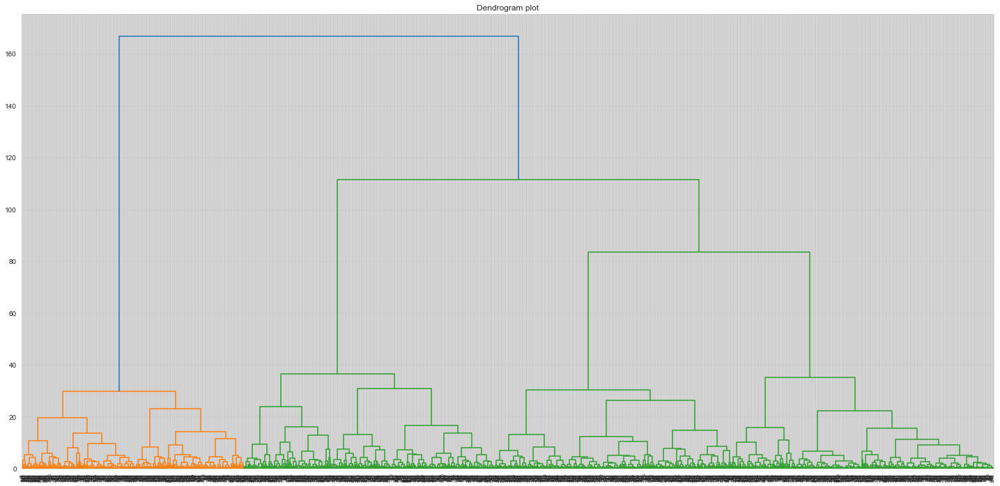

In [74]:
%matplotlib inline
import scipy.cluster.hierarchy as sch
plt.figure(figsize=(25,12))
dendrogram=sch.dendrogram(sch.linkage(pca_df,method = 'ward'))
plt.title('Dendrogram plot')
plt.show()

In [75]:
agg = AgglomerativeClustering(n_clusters=4)
y_pred_agg = agg.fit_predict(pca_df)
pca_df["Clusters_agg"] = y_pred_agg
df["Clusters_agg"]= y_pred_agg

In [77]:
Scene = dict(xaxis = dict(title  = 'First Column'),yaxis = dict(title  = 'Second Column'),zaxis = dict(title  = 'Third Column'))

trace = go.Scatter3d(x=pca_df['First_Column'], y=pca_df['Second_Column'], z=pca_df['Third_Column'], 
                     mode='markers',marker=dict(color = pca_df["Clusters_agg"], size= 10, 
                        line=dict(color= 'black',width = 10)))
layout = go.Layout(margin=dict(l=0,r=0),scene = Scene,height = 800,width = 800)
data = [trace]
fig = go.Figure(data = data, layout = layout)
fig.show()

**Quantities of samples in each cluster.**

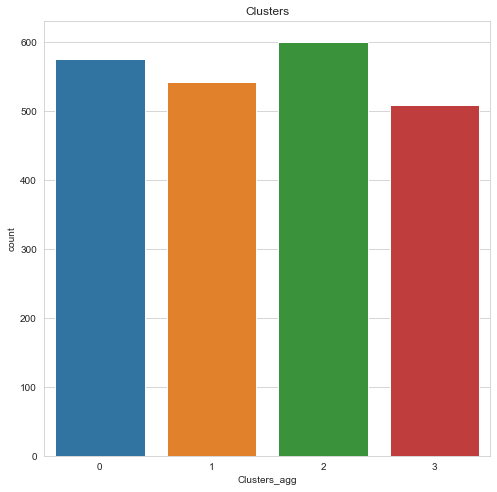

In [83]:
pl = sns.countplot(x=df["Clusters_agg"], palette= 'tab10')
pl.set_title("Clusters")
plt.show()

**Cluster profile based on income and spent.**

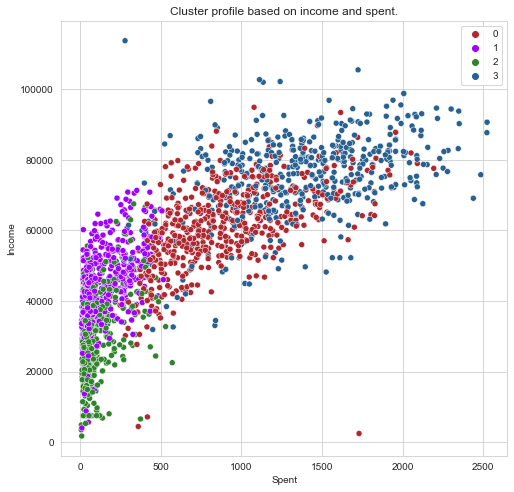

In [84]:
pal = ["#b0282f","#9E00FF", "#30832c","#286090"]
plt.rcParams['figure.figsize'] = [8,8]
pl = sns.scatterplot(data = df,x=df["Spent"], y=df["Income"],hue=df["Clusters_agg"], palette= pal)
pl.set_title("Cluster profile based on income and spent.")
plt.legend()
plt.show()

* **Grup 0:** Average income, high spending
* **Grup 1:** Average income, low spending
* **Grup 2:** Low income, low spending.
* **Grup 3:** High income, high spending

## PROFILING

* **Qualifications of customers belonging to different clusters.**

In [85]:
fig = px.box(df, x=df['Children'], y=df['Spent'], points="all", color="Clusters_agg")
fig.show()

In [86]:
fig = px.box(df, x=df['Family_Size'], y=df['Spent'], points="all", color="Clusters_agg")
fig.show()

In [87]:
fig = px.box(df, x=df['Is_Parent'], y=df['Spent'], points="all", color="Clusters_agg")
fig.show()

In [88]:
fig = px.box(df, x=df['Education'], y=df['Spent'], points="all", color="Clusters_agg")
fig.show()

In [89]:
fig = px.box(df, x=df['Living_With'], y=df['Spent'], points="all", color="Clusters_agg")
fig.show()